In [1]:
!pip install -q -U diffusers transformers accelerate 

In [2]:
import torch

from diffusers import StableVideoDiffusionPipeline
from diffusers.utils import load_image, export_to_video, export_to_gif
from IPython.display import Video


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-02-13 09:09:29.752385: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-13 09:09:29.752484: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-13 09:09:29.902023: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
class CFG:
    model = "stabilityai/stable-video-diffusion-img2vid-xt"

In [4]:

pipe = StableVideoDiffusionPipeline.from_pretrained(
    CFG.model, torch_dtype=torch.float16, variant="fp16"
)
pipe.enable_model_cpu_offload()

generator = torch.manual_seed(42)

model_index.json:   0%|          | 0.00/496 [00:00<?, ?B/s]

Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

unet/config.json:   0%|          | 0.00/984 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

image_encoder/config.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/533 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/3.05G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/196M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [5]:

# image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/svd/rocket.png")
# image = image.resize((1024, 576))

# frames = pipe(image, decode_chunk_size=8, generator=generator, motion_bucket_id=180, noise_aug_strength=0.1).frames[0]
# export_to_video(frames, "generated0.mp4", fps=7)

# export_to_gif(frames, "generated0.gif")


# from IPython.display import Image
# Image(open('generated0.gif','rb').read())



In [6]:

image = load_image("/kaggle/input/svdimages/src_img1.png")
image = image.resize((1024, 576))

frames = pipe(image, decode_chunk_size=8, generator=generator, motion_bucket_id=180, noise_aug_strength=0.1).frames[0]
export_to_video(frames, "generated1.mp4", fps=7)
export_to_gif(frames, "generated1.gif")


  0%|          | 0/25 [00:00<?, ?it/s]

'generated1.gif'

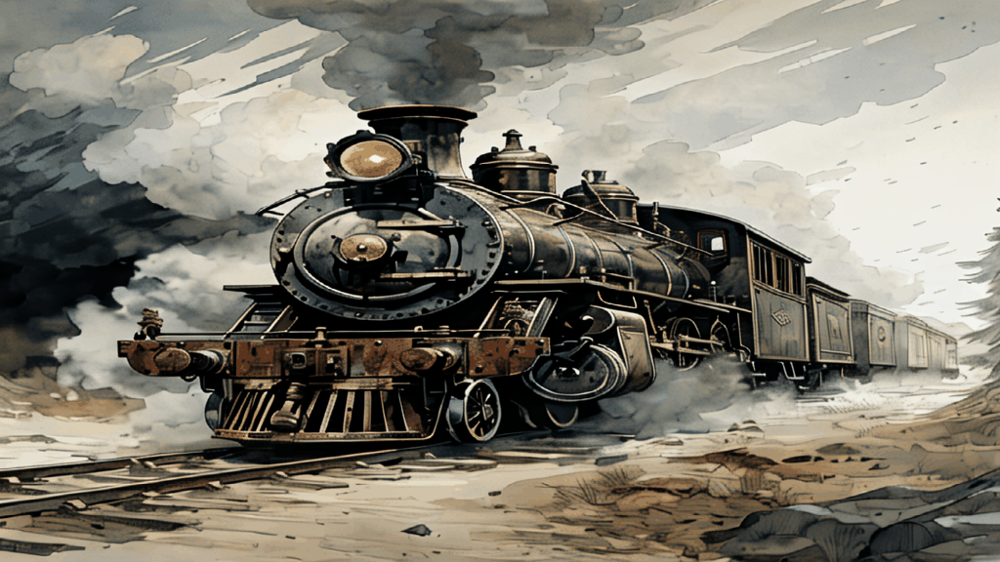

In [7]:
from IPython.display import Image
Image(open('generated1.gif','rb').read())



In [8]:

image = load_image("/kaggle/input/svdimages/src_img2.jpeg")
image = image.resize((1024, 576))

frames = pipe(image, decode_chunk_size=8, generator=generator, motion_bucket_id=180, noise_aug_strength=0.1).frames[0]
export_to_video(frames, "generated2.mp4", fps=7)
export_to_gif(frames, "generated2.gif")


  0%|          | 0/25 [00:00<?, ?it/s]

'generated2.gif'

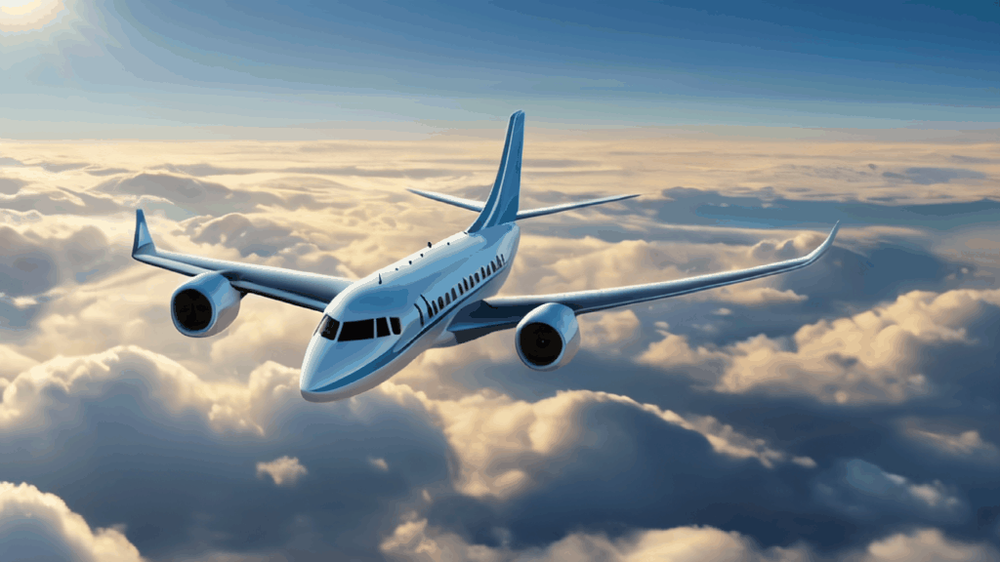

In [9]:
from IPython.display import Image
Image(open('generated2.gif','rb').read())

